In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read, write
Fs,data_ = read('test_audio.wav')

In [2]:
from IPython.display import Audio
Audio('test_audio.wav')

In [22]:
print ("Fs =",Fs)
data = data_[:,0]
data_new =[]
for i in range(len(data)):
    data_new.append(data[i])
    data_new.append(0)
    data_new.append(0)
    

data_fd = np.fft.fft(data)
data_new_fd = np.fft.fft(data_new)
freq_i = np.fft.fftfreq(len(data),d=1/Fs)
freq_n = np.fft.fftfreq(len(data_new),d=1/Fs)



Fs = 48000


Text(0.5, 1.0, 'frequency domain after upsample')

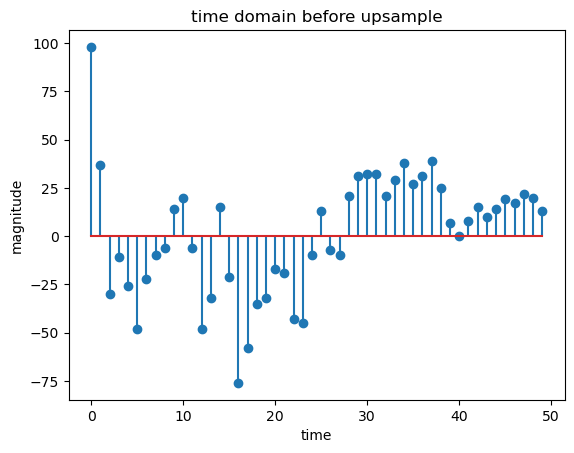

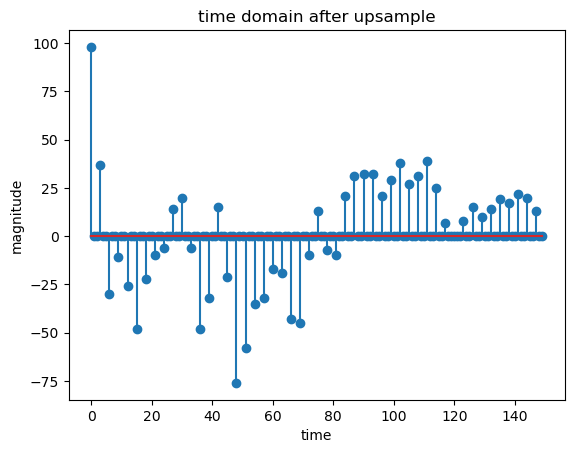

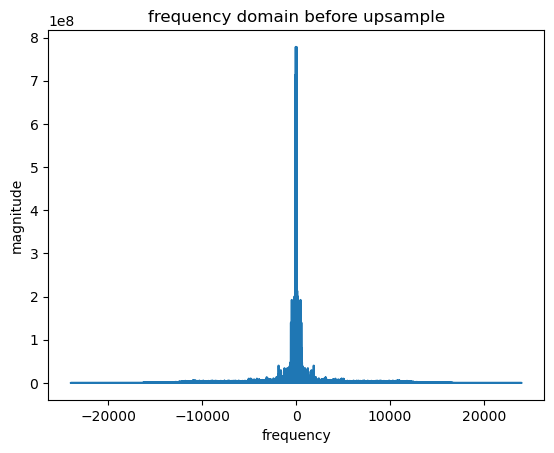

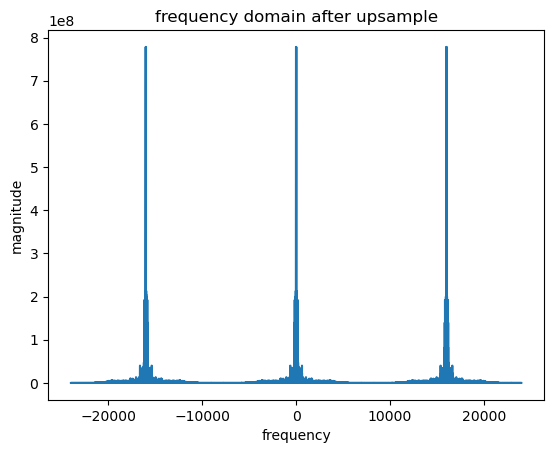

In [27]:
plt.figure()
plt.stem(data[-50:])
plt.xlabel('time')
plt.ylabel('magnitude')
plt.title('time domain before upsample')

plt.figure()
plt.stem(data_new[-150:])
plt.xlabel('time')
plt.ylabel('magnitude')
plt.title('time domain after upsample')

plt.figure()
plt.plot(freq_i,np.abs(data_fd))
plt.xlabel('frequency')
plt.ylabel('magnitude')
plt.title('frequency domain before upsample')

plt.figure()
plt.plot(freq_n,np.abs(data_new_fd))
plt.xlabel('frequency')
plt.ylabel('magnitude')
plt.title('frequency domain after upsample')

Question:
    
    1. the FFT is compressed by a factor of 3, as DFT is periodic, there are frequency leakage (aliasing) 
    
    2. we can apply a low pass filter to the upsampled data with cut off frequency at sample_frq/3

Text(0.5, 1.0, 'frequency domain after downsample')

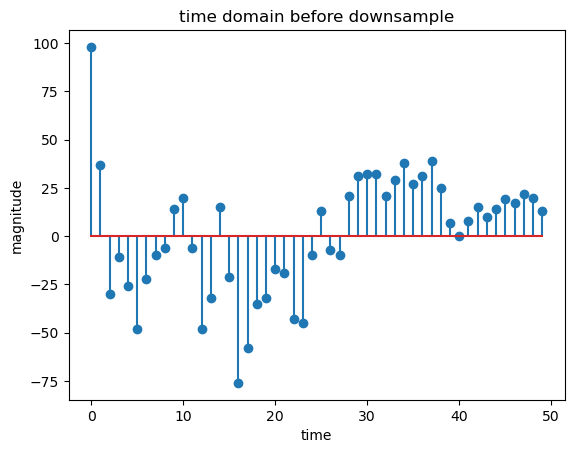

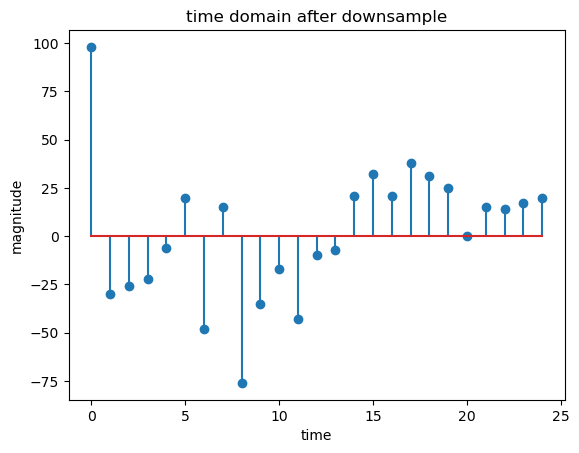

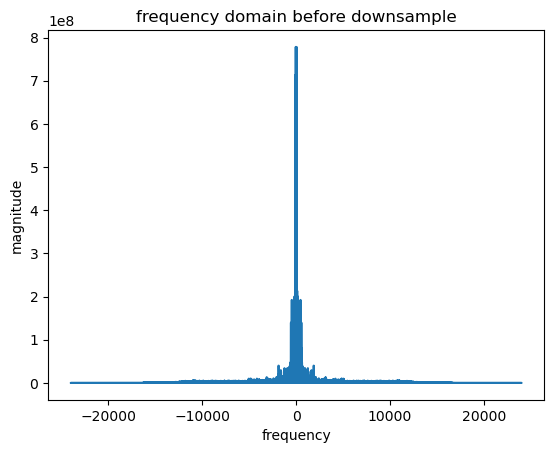

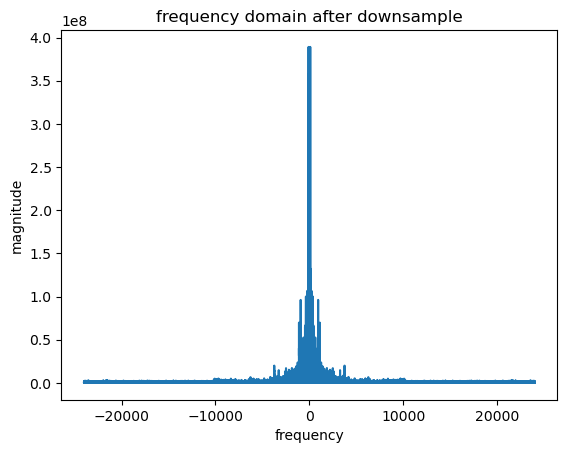

In [30]:
data_dn=[]
for i in range (int(len(data)/2)):
    data_dn.append(data[2*i])

data_dn_f = np.fft.fft(data_dn)
freq_dn = np.fft.fftfreq(len(data_dn_f),d=1/Fs)

plt.figure()
plt.stem(data[-50:])
plt.xlabel('time')
plt.ylabel('magnitude')
plt.title('time domain before downsample')

plt.figure()
plt.stem(data_dn[-25:])
plt.xlabel('time')
plt.ylabel('magnitude')
plt.title('time domain after downsample')

plt.figure()
plt.plot(freq_i,np.abs(data_fd))
plt.xlabel('frequency')
plt.ylabel('magnitude')
plt.title('frequency domain before downsample')

plt.figure()
plt.plot(freq_dn,np.abs(data_dn_f))
plt.xlabel('frequency')
plt.ylabel('magnitude')
plt.title('frequency domain after downsample')    

Question:
    
    1. the downsampled signal's fft was streched by a factor of 2
    
    2. we can apply an anti-aliasing filter before downsampling (LPF)

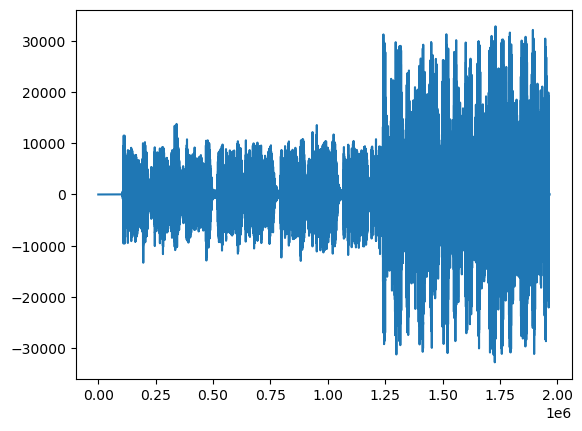

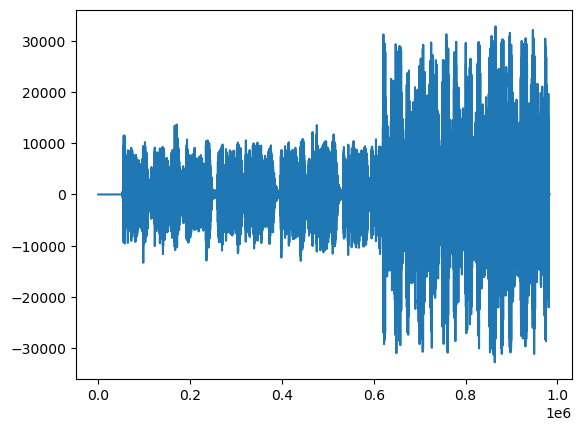

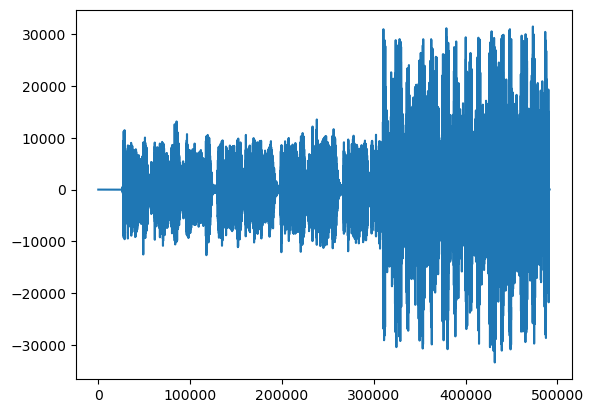

In [41]:
from scipy import signal
from scipy.io.wavfile import read
from IPython.display import Audio

Fs, data = read('test_audio.wav')
data = data[:, 0]
data = data.astype('float')

def get_output(up_,down_):


    up_ratio = up_
    down_ratio = down_

    output = signal.resample_poly(data, up_ratio, down_ratio)
    plt.figure()
    plt.plot(output)
    return output


output1 = get_output(4,2)
output2 = get_output(1,1)
output3 = get_output(2,4)



In [42]:
Audio(output1, rate=Fs)

In [43]:
Audio(output2, rate=Fs)

In [44]:
Audio(output3, rate=Fs)

Question:
    
    If we have a net upsampling effect (M/N >1) we will have a "slow playback" effect on the audio where the pitch gets lower and sound more like a male.
    
    If we have a net downsampling effect (M/N <1) we will have a "fast playback" effect on the audio where the pitch gets higher and some artifacts are intruduced.